In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
import os

dir = "/content/"

os.chdir(dir)

In [ ]:
ls

pytorchV2_output_500_epochs_LR_0.1.wav  short_bohemian.wav
sample_data/                            short_la_bruja.wav


In [ ]:
import librosa
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


content  = 'short_bohemian.wav'
style = 'short_la_bruja.wav'

# Ajusta sr al deseado (e.g. 22050)
y_content, sr = librosa.load(content, sr=None)
y_style,   _  = librosa.load(style,    sr=sr)

# Calcula Mel-spectrogramas log‑aritmicos
def mel_spec(y):
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=512, n_mels=128)
    return librosa.power_to_db(S)

mel_c = mel_spec(y_content)
mel_s = mel_spec(y_style)

In [ ]:
mel_c.shape , mel_s.shape

((128, 3876), (128, 3876))

In [ ]:
from torchvision import models

# 1. Carga y reemplaza en CPU
vgg = models.vgg19(pretrained=True).features
vgg[0] = torch.nn.Conv2d(1, 64, kernel_size=3, padding=1)

# 2. Congela
for p in vgg.parameters():
    p.requires_grad = False

# 3. Ahora sí, mueve TODO el modelo a CUDA y ponlo en eval
vgg = vgg.to(device).eval()

# Capas de interés
content_layers = ['21']           # e.g. conv4_2
style_layers   = ['0','5','10','19','28']  # varias capas

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
import torch.nn.functional as F

def gram(x):
    b, c, h, w = x.size()
    features = x.view(b, c, h*w)
    G = torch.bmm(features, features.transpose(1,2))
    return G / (c * h * w)

# Precompute target
def get_feats(x, model, layers):
    feats = {}
    h = x
    for name, layer in model._modules.items():
        h = layer(h)
        if name in layers:
            feats[name] = h
    return feats

# Tensor iniciales (batch=1, canal=1)
t_content = torch.from_numpy(mel_c).unsqueeze(0).unsqueeze(0).to(device)
t_style   = torch.from_numpy(mel_s).unsqueeze(0).unsqueeze(0).to(device)

content_feats = get_feats(t_content, vgg, content_layers)
content_feats = {ln: f.to(device) for ln, f in content_feats.items()}

style_feats   = get_feats(t_style,   vgg, style_layers)
style_targets = {ln: gram(f) for ln, f in style_feats.items()}
style_targets = {ln: G.to(device) for ln, G in style_targets.items()}

In [ ]:
# Partimos de contenido (o ruido)
lra = 0.1
opt_img = t_content.clone().requires_grad_(True).to(device)
optimizer = torch.optim.LBFGS([opt_img], lr=lra)

In [ ]:
content_weight = 1e0
style_weight   = 1e5

losses = []


def loss_fn():
    optimizer.zero_grad()
    feats_opt = get_feats(opt_img, vgg, content_layers+style_layers)
    # Content
    c_loss = F.mse_loss(feats_opt[content_layers[0]], content_feats[content_layers[0]])
    # Style
    s_loss = 0
    for ln in style_layers:
        G_opt = gram(feats_opt[ln])
        s_loss += F.mse_loss(G_opt, style_targets[ln])
    total = content_weight*c_loss + style_weight*s_loss
    total.backward()
    losses.append(total.item())

    return total

In [ ]:
epochs = 500

import numpy as np
import soundfile as sf

out_loss = []

for i in range(epochs):
    optimizer.step(loss_fn)
    if (i+1)%50 == 0:
        print(f"Iter {i+1}/{epochs}, loss =  {losses[-1]:.4f}")
        # Convertimos DB a potencia
        # mel_db = opt_img.detach().squeeze().cpu().numpy()
        # S = librosa.db_to_power(mel_db)
        # Inversa de Mel
        # audio = librosa.feature.inverse.mel_to_audio(S, sr=sr, n_fft=2048, hop_length=512)

        # song_name = f'pytorchV2_output_{i+1}_epochs_LR_{lra}.wav'

        # sf.write(song_name, audio, sr, format = 'WAV')

        out_loss.append(losses[-1])

Iter 50/500, loss =  5.3983
Iter 100/500, loss =  5.3232
Iter 150/500, loss =  5.2918
Iter 200/500, loss =  5.2736
Iter 250/500, loss =  5.2611
Iter 300/500, loss =  5.2519
Iter 350/500, loss =  5.2447
Iter 400/500, loss =  5.2393
Iter 450/500, loss =  5.2354
Iter 500/500, loss =  5.2339


In [ ]:
import numpy as np
import soundfile as sf

# Convertimos DB a potencia
mel_db = opt_img.detach().squeeze().cpu().numpy()
S = librosa.db_to_power(mel_db)
# Inversa de Mel
audio = librosa.feature.inverse.mel_to_audio(S, sr=sr, n_fft=2048, hop_length=512)

song_name = f'pytorchV2_output_{epochs}_epochs_LR_{lra}.wav'

sf.write(song_name, audio, sr, format = 'WAV')

In [ ]:
from IPython.display import Audio, display

display(Audio(song_name))

In [ ]:
display(Audio(content))
display(Audio(style))

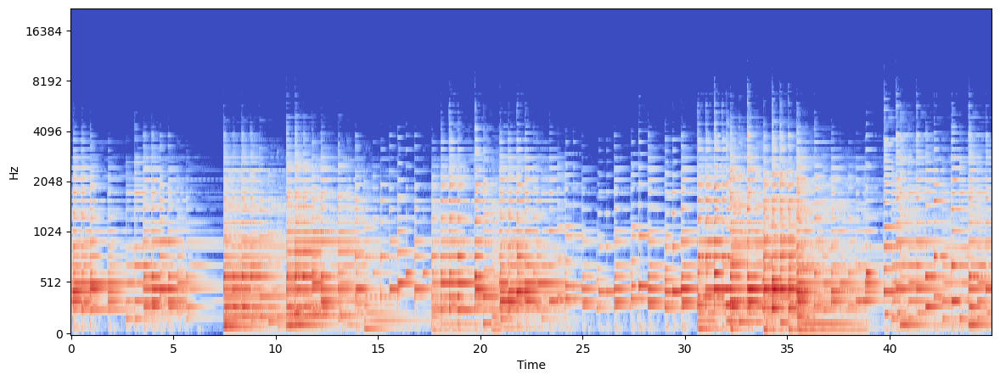

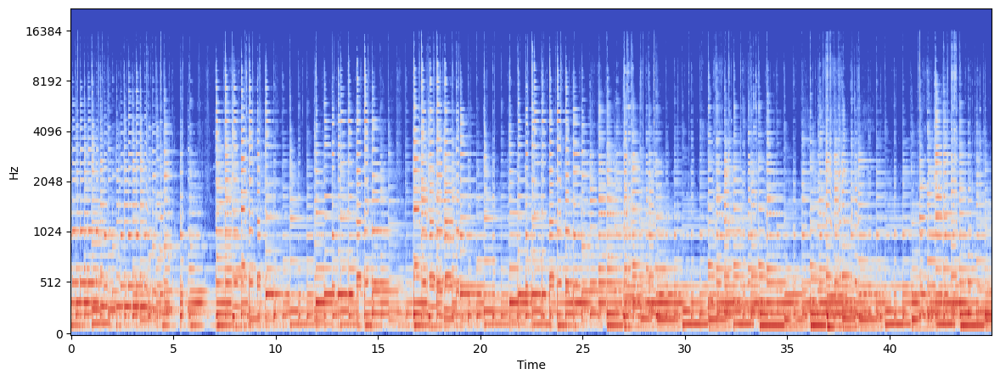

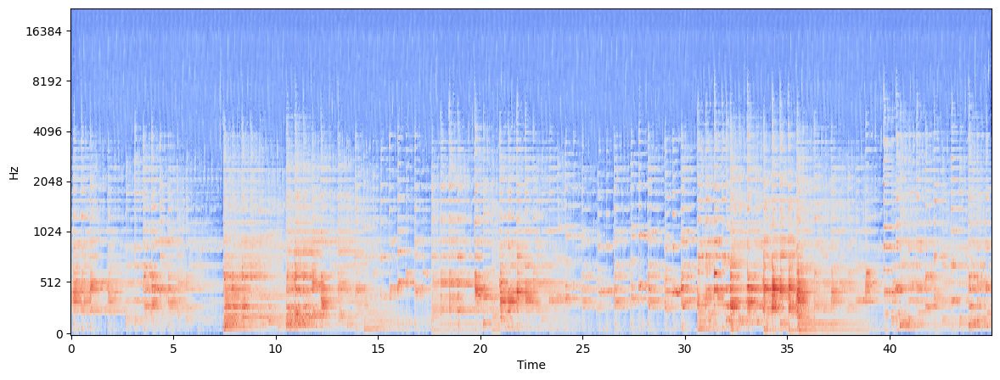

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize=(14, 5))
librosa.display.specshow(mel_c, sr=sr, x_axis='time', y_axis='mel')

plt.figure(figsize=(14, 5))
librosa.display.specshow(mel_s, sr=sr, x_axis='time', y_axis='mel')

plt.figure(figsize=(14, 5))
librosa.display.specshow(mel_db, sr=sr, x_axis='time', y_axis='mel')


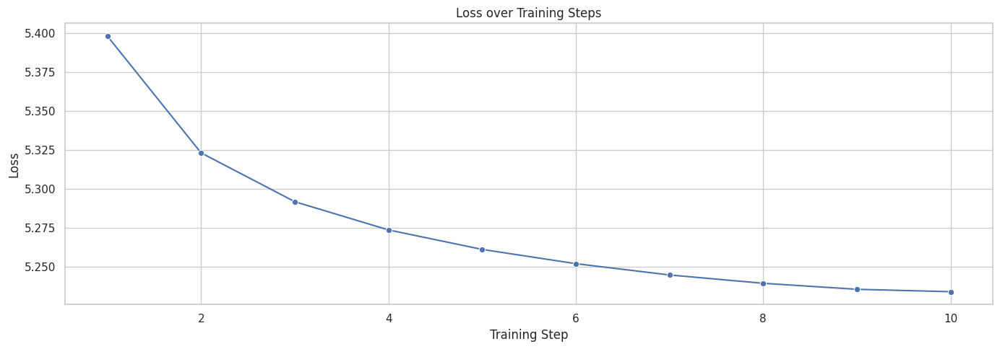

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: list of loss values collected during training
losses = [i for i in range(50, 550, 50)]

# Optional: create a dictionary to make it compatible with seaborn
import pandas as pd
data = pd.DataFrame({'Step': list(range(1, len(losses) + 1)), 'Loss': out_loss})

# Plot
sns.set(style="whitegrid")
plt.figure(figsize=(14, 5))
sns.lineplot(x='Step', y='Loss', data=data, marker='o')
plt.title('Loss over Training Steps')
plt.xlabel('Training Step')
plt.ylabel('Loss')
plt.tight_layout()
plt.show()